# Time series analysis with HyP3 and MintPy

This notebook walks through performing a time-series analysis with On Demand InSAR products from the Alaska Satellite facility and MintPy.



In [1]:
from pathlib import Path

from dateutil.parser import parse as parse_date

In [2]:
from pathlib import Path
import shutil
import sys

import h5py
#from ipyfilechooser import FileChooser
from mintpy.cli import view, tsview, plot_network, plot_transection
import mintpy.utils
from mintpy.utils import plot, readfile
import numpy as np
#import opensarlab_lib as osl

### Set parameters

In [3]:
# === Define project paths ===
project_name = "aoi_3_02_bologna"

# Directory where HyP3 products (SLCs/interferograms) are stored
data_dir = Path("/mnt/data") / project_name
hyp_int_dir = data_dir / "hyp_int"  # For interferograms only
mint_path = data_dir / 'MintPy'

# Working directory for MintPy, config files, etc.
work_dir = Path.home() / "work" / "aoi_3_02_Bologna"

# Create necessary folders if they don't exist
for d in [data_dir, hyp_int_dir, work_dir, mint_path]:
    d.mkdir(parents=True, exist_ok=True)

print("✔️ Project setup complete:")
print(f"  - Data directory:      {data_dir}")
print(f"  - HyP3 interferograms: {hyp_int_dir}")
print(f"  - Work directory:      {work_dir}")
print(f"  - MintPy directory:    {mint_path}")


✔️ Project setup complete:
  - Data directory:      /mnt/data/aoi_3_02_bologna
  - HyP3 interferograms: /mnt/data/aoi_3_02_bologna/hyp_int
  - Work directory:      /home/ubuntu/work/aoi_3_02_Bologna
  - MintPy directory:    /mnt/data/aoi_3_02_bologna/MintPy


In [ ]:
from pathlib import Path
from zipfile import ZipFile
from tqdm.notebook import tqdm
import shutil, tempfile, os

# Assumes you already defined:
# data_dir = Path("/mnt/data/aoi_3_02_bologna")  # or your existing variable

assert data_dir.exists(), f"data_dir does not exist: {data_dir}"

zips = sorted(data_dir.glob("*.zip"))
if not zips:
    print("No ZIPs found in", data_dir)

completed, skipped, failed = [], [], []

for zpath in tqdm(zips, desc="Unzipping HyP3 jobs"):
    # Each ZIP will extract into a folder named after the zip stem
    out_dir = data_dir 
    marker  = out_dir / ".unzipped.ok"

    # Skip if already done (both directory + marker exist)
    if out_dir.is_dir() and marker.is_file():
        skipped.append(zpath.name)
        continue

    # If the output folder exists from a partial run, remove it safely
    if out_dir.exists() and not marker.exists():
        shutil.rmtree(out_dir, ignore_errors=True)

    try:
        with ZipFile(zpath) as zf:
            # Quick integrity check before extracting
            bad = zf.testzip()
            if bad is not None:
                raise RuntimeError(f"Archive integrity error at member: {bad}")

            # Extract to a temp dir, then move into place atomically
            with tempfile.TemporaryDirectory(dir=str(data_dir)) as tmpd:
                tmp_out = Path(tmpd) / zpath.stem
                tmp_out.mkdir(parents=True, exist_ok=True)
                members = zf.infolist()

                for m in tqdm(members, leave=False, desc=f"Extracting {zpath.name}"):
                    zf.extract(m, path=tmp_out)

                # Basic sanity check: expect at least one GeoTIFF/TIFF in the product
                tif_count = sum(1 for _ in tmp_out.rglob("*.tif")) + sum(1 for _ in tmp_out.rglob("*.tiff"))
                if tif_count == 0:
                    raise RuntimeError("No .tif/.tiff files found after extraction (unexpected HyP3 layout?)")

                # Move temp folder to final location
                if out_dir.exists():
                    shutil.rmtree(out_dir, ignore_errors=True)
                shutil.move(str(tmp_out), str(out_dir))

        # Write a marker so future runs can skip
        marker.write_text("ok\n")

        # Delete the zip ONLY after success
        try:
            zpath.unlink()
        except Exception as e:
            print(f"Warning: could not delete ZIP {zpath.name}: {e}")

        completed.append(zpath.name)

    except Exception as e:
        failed.append((zpath.name, str(e)))
        # Clean partial output if any
        if out_dir.exists() and not marker.exists():
            shutil.rmtree(out_dir, ignore_errors=True)

# --- Summary ---
print("\n=== Unzip summary ===")
print(f"Completed: {len(completed)}")
for n in completed[:10]:
    print("  ✓", n)
if len(completed) > 10:
    print("  ...")

print(f"Skipped (already done): {len(skipped)}")
for n in skipped[:10]:
    print("  ↷", n)
if len(skipped) > 10:
    print("  ...")

print(f"Failed: {len(failed)}")
for n, msg in failed:
    print(f"  ✗ {n} -> {msg}")

if failed:
    raise RuntimeError("Some ZIPs failed to unzip; see summary above.")


In [4]:
# Download GPS time series for a specific station
import requests
from pathlib import Path
from io import StringIO
import pandas as pd
from tqdm import tqdm

# === Setup ===
station = "MEDI"
gps_dir = data_dir / "gps"
gps_dir.mkdir(exist_ok=True)
gps_path = gps_dir / f"{station}.EU.tenv3"


In [ ]:
from pathlib import Path
import shutil, os


# 1) Find every folder that actually contains HyP3 product tifs
targets = set(p.parent for p in data_dir.rglob("*_unw_phase*.tif"))

moved, skipped = [], []

def unique_dest(dst):
    """make a unique destination if name collision happens"""
    if not dst.exists():
        return dst
    i = 1
    while True:
        alt = dst.parent / f"{dst.name}_{i}"
        if not alt.exists():
            return alt
        i += 1

for src in sorted(targets):
    if src.parent == data_dir:
        skipped.append(src)
        continue
    dst = unique_dest(data_dir / src.name)
    print(f"→ Moving  {src}  →  {dst}")
    shutil.move(str(src), str(dst))
    moved.append((src, dst))

# 2) Clean up any now-empty wrapper directories (bottom-up)
for d in sorted([p for p in data_dir.rglob("*") if p.is_dir()], key=lambda x: len(x.parts), reverse=True):
    try:
        next(d.iterdir())
    except StopIteration:
        # empty
        d.rmdir()

print(f"\nDone. Moved {len(moved)} product folders, skipped {len(skipped)} already-flat ones.")


In [5]:
print(f"Downloading GPS data for station {station} to {gps_path}")


# === Download ===
url = f"https://geodesy.unr.edu/gps_timeseries/tenv3/plates/EU/{station}.EU.tenv3"

response = requests.get(url)
response.raise_for_status()
with open(gps_path, 'w') as f:
    f.write(response.text)

print(f"✅ Downloaded {station} time series to {gps_path}")


✅ Downloaded MEDI time series to /mnt/data/aoi_3_02_bologna/gps/MEDI.EU.tenv3


In [6]:
# === Read and process GPS data ===
import pandas as pd

# Define correct column names based on your structure
col_names = [
    "site", "YYMMMDD", "decimal_year", "MJD", "week", "doy",
    "reflon", "e0", "east", "n0", "north", "u0", "up", "ant",
    "sig_e", "sig_n", "sig_u", "corr_en", "corr_eu", "corr_nu",
    "lat", "lon", "height"
]

# Read fixed-width file with manual column names
df_gps = pd.read_csv(gps_path, delim_whitespace=True, comment="#", names=col_names)

# Convert to numeric
df_gps['decimal_year'] = pd.to_numeric(df_gps['decimal_year'], errors='coerce')
df_gps['up'] = pd.to_numeric(df_gps['up'], errors='coerce')
df_gps['sig_u'] = pd.to_numeric(df_gps['sig_u'], errors='coerce')

# Drop rows with missing time or up values
df_gps = df_gps.dropna(subset=['decimal_year', 'up', 'sig_u'])


/mnt/data/tmp/ipykernel_3404024/1483524775.py:13: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_gps = pd.read_csv(gps_path, delim_whitespace=True, comment="#", names=col_names)


In [7]:
lat = df_gps['lat'].iloc[0]
lon = df_gps['lon'].iloc[0]
print(f"📍 GPS station {station} at lat={lat}, lon={lon}")



📍 GPS station MEDI at lat=44.5199558120, lon=-348.3531879553


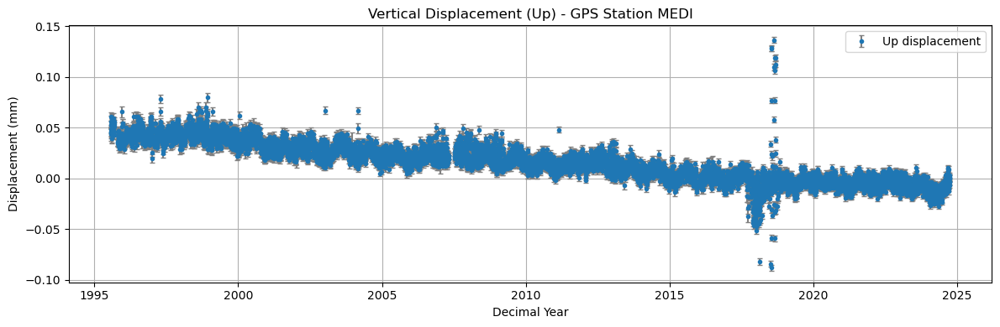

In [8]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.errorbar(df_gps['decimal_year'], df_gps['up'], yerr=df_gps['sig_u'],
             fmt='o', markersize=3, capsize=2, label='Up displacement', ecolor='gray')
plt.xlabel('Decimal Year')
plt.ylabel('Displacement (mm)')
plt.title('Vertical Displacement (Up) - GPS Station MEDI')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



In [9]:
weather_dir = Path("/mnt/data/aoi_3_bologna_weather/")
weather_dir.mkdir(exist_ok=True)
print(f"Weather data directory: {weather_dir}")



Weather data directory: /mnt/data/aoi_3_bologna_weather


In [19]:
from pathlib import Path
import cdsapi

c = cdsapi.Client()

for year in range(2016, 2026):
    outfile = weather_dir / f"era5_tcwv_{year}.nc"
    if outfile.exists():
        print(f"{outfile.name} already downloaded.")
        continue

    c.retrieve(
        'reanalysis-era5-single-levels',
        {
            'product_type': 'reanalysis',
            'variable': ['total_column_water_vapour'],
            'year': str(year),
            'month': [f"{m:02d}" for m in range(1, 13)],
            'day': [f"{d:02d}" for d in range(1, 32)],
            'time': ['12:00'],
            'format': 'netcdf',
            'area': [44.6, 11.2, 44.4, 11.5],  # [north, west, south, east]
        },
        str(outfile)
    )
    print(f"Downloaded ERA5 TCWV data for {year} to {outfile}")

2025-08-18 22:09:20,916 INFO [2024-09-26T00:00:00] Watch our [Forum](https://forum.ecmwf.int/) for Announcements, news and other discussed topics.


era5_tcwv_2016.nc already downloaded.
era5_tcwv_2017.nc already downloaded.
era5_tcwv_2018.nc already downloaded.
era5_tcwv_2019.nc already downloaded.
era5_tcwv_2020.nc already downloaded.
era5_tcwv_2021.nc already downloaded.
era5_tcwv_2022.nc already downloaded.
era5_tcwv_2023.nc already downloaded.
era5_tcwv_2024.nc already downloaded.
era5_tcwv_2025.nc already downloaded.


In [10]:
from netCDF4 import Dataset

fn = weather_dir / "era5_tcwv_2016.nc"
ds = Dataset(fn, "r")

print(ds)              # summary of dimensions, variables, attributes
print(ds.variables.keys())  # list of variables

# Inspect one variable
tcwv = ds.variables["tcwv"]
print(tcwv)            # metadata
print(tcwv.shape)      # dimensions

# Read a slice
data = tcwv[0,:,:]


<class 'netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    GRIB_centre: ecmf
    GRIB_centreDescription: European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre: 0
    Conventions: CF-1.7
    institution: European Centre for Medium-Range Weather Forecasts
    history: 2025-07-18T13:03 GRIB to CDM+CF via cfgrib-0.9.15.0/ecCodes-2.41.0 with {"source": "tmpli0te778/data.grib", "filter_by_keys": {"stream": ["oper"], "stepType": ["instant"]}, "encode_cf": ["parameter", "time", "geography", "vertical"]}
    dimensions(sizes): valid_time(366), latitude(1), longitude(2)
    variables(dimensions): int64 number(), int64 valid_time(valid_time), float64 latitude(latitude), float64 longitude(longitude), <class 'str'> expver(valid_time), float32 tcwv(valid_time, latitude, longitude)
    groups: 
dict_keys(['number', 'valid_time', 'latitude', 'longitude', 'expver', 'tcwv'])
<class 'netCDF4.Variable'>
float32 tcwv(valid_time, latitude, longitude)
    _FillValue: nan

In [12]:
mintpy_config = mint_path / 'mintpy_config.txt'
print(f"Writing MintPy config to {mintpy_config}")


Writing MintPy config to /mnt/data/aoi_3_02_bologna/MintPy/mintpy_config.txt


In [ ]:
mintpy_config.write_text(
f"""
## ===== MintPy config for Bologna HyP3 stack on cluster =====

# Parallel compute setup
mintpy.compute.cluster    = local
mintpy.compute.numWorker  = 64
mintpy.compute.memory     = auto

# Input processor
mintpy.load.processor     = hyp3

# HyP3 product files
mintpy.load.unwFile       = /mnt/data/aoi_3_02_bologna/*/*_unw_phase*.tif
mintpy.load.corFile       = /mnt/data/aoi_3_02_bologna/*/*_corr*.tif
mintpy.load.demFile       = /mnt/data/aoi_3_02_bologna/*/*_dem*.tif
mintpy.load.incAngleFile  = /mnt/data/aoi_3_02_bologna/*/*_lv_theta*.tif
mintpy.load.azAngleFile   = /mnt/data/aoi_3_02_bologna/*/*_lv_phi*.tif
mintpy.load.waterMaskFile = /mnt/data/aoi_3_02_bologna/*/*_water_mask*.tif

# Network pruning
mintpy.network.maxTempBaseline = 140
mintpy.network.maxPerpBaseline = 150

# Tropospheric delay (ERA5 model)
mintpy.troposphericDelay.method      = pyaps
mintpy.weatherModel.weatherModel     = ERA5
mintpy.weatherModel.weatherDir       = /mnt/data/aoi_3_bologna_weather
mintpy.weatherModel.weatherFile      = era5_tcwv_*.nc
mintpy.weatherModel.heightRef        = auto

# Reference point (GNSS MEDI station)
mintpy.reference.pixelMethod   = lonlat
mintpy.reference.lalo          = 44.5199558120, 11.6468120447
mintpy.reference.interpMethod  = linear

# Masks and unwrap settings
mintpy.unwrapMask.connCompMinPix = 100
mintpy.unwrapMask.maskFile       = auto
mintpy.tempCohMask.min           = 0.4
mintpy.waterBody.mask            = auto
mintpy.reference.maskFile        = auto

# Misc
mintpy.deramp    = quadratic
mintpy.workDir   = /mnt/data/aoi_3_02_bologna/mintpy

##---------subset (optional):
## if both yx and lalo are specified, use lalo option unless a) no lookup file AND b) dataset is in radar coord
mintpy.subset.yx = 0:2939,0:3713      #[y0:y1,x0:x1 / no], auto for no
mintpy.subset.lalo          = auto    #[S:N,W:E / no], auto for no

""")


In [13]:
!ls -a {mint_path}
print(f"MintPy config written to {mintpy_config}")

.			 reference_date.txt
..			 rms_timeseriesResidual_ramp.txt
ERA5			 smallbaselineApp.cfg
avgSpatialCoh.h5	 temporalCoherence.h5
coherenceSpatialAvg.txt  timeseries.h5
demErr.h5		 timeseriesResidual.h5
inputs			 timeseriesResidual_ramp.h5
maskConnComp.h5		 timeseries_ERA5.h5
maskTempCoh.h5		 timeseries_ERA5_ramp.h5
mintpy_config.txt	 timeseries_ERA5_ramp_demErr.h5
numInvIfgram.h5		 velocity.h5
pic			 velocityERA5.h5
plots			 waterMask.h5
MintPy config written to /mnt/data/aoi_3_02_bologna/MintPy/mintpy_config.txt


In [22]:
!smallbaselineApp.py {mintpy_config} --work-dir {mint_path} --dostep load_data


MintPy version 1.6.1, date 2024-07-31
--RUN-at-2025-08-19 17:58:40.413434--
Current directory: /home/ubuntu/work
Run routine processing with smallbaselineApp.py on steps: ['load_data']
Remaining steps: ['modify_network', 'reference_point', 'quick_overview', 'correct_unwrap_error', 'invert_network', 'correct_LOD', 'correct_SET', 'correct_ionosphere', 'correct_troposphere', 'deramp', 'correct_topography', 'residual_RMS', 'reference_date', 'velocity', 'geocode', 'google_earth', 'hdfeos5']
--------------------------------------------------
Project name: mintpy_config
Go to work directory: /mnt/data/aoi_3_02_bologna/MintPy
read custom template file: /mnt/data/aoi_3_02_bologna/MintPy/mintpy_config.txt
update default template based on input custom template
No new option value found, skip updating /mnt/data/aoi_3_02_bologna/MintPy/smallbaselineApp.cfg
copy mintpy_config.txt    to inputs   directory for backup.
copy mintpy_config.txt    to pic      directory for backup.
read default template fi

read temporal/spatial baseline info from file: /mnt/data/aoi_3_02_bologna/MintPy/inputs/ifgramStack.h5
open ifgramStack file: ifgramStack.h5
coherenceSpatialAvg.txt already exists, read it directly
number of acquisitions: 156
number of interferograms: 163
shift all perp baseline by -0.023877998813986778 to zero mean for plotting
--------------------------------------------------
number of interferograms marked as drop: 0
number of interferograms marked as keep: 163
number of acquisitions marked as drop: 0


/home/ubuntu/anaconda3/envs/insar/lib/python3.13/site-packages/mintpy/utils/utils1.py:198: UserWarning: Input line 1 contained no data and will not be counted towards `max_rows=50000`.  This differs from the behaviour in NumPy <=1.22 which counted lines rather than rows.  If desired, the previous behaviour can be achieved by using `itertools.islice`.
Please see the 1.23 release notes for an example on how to do this.  If you wish to ignore this warning, use `warnings.filterwarnings`.  This warning is expected to be removed in the future and is given only once per `loadtxt` call.
  txtContent = np.loadtxt(fname, dtype=bytes).astype(str)


max perpendicular baseline: 149.39 m
max temporal      baseline: 48.0 days
showing coherence
data range: [0.3099, 0.6959]
display range: (0.2, 1.0)
showing ...


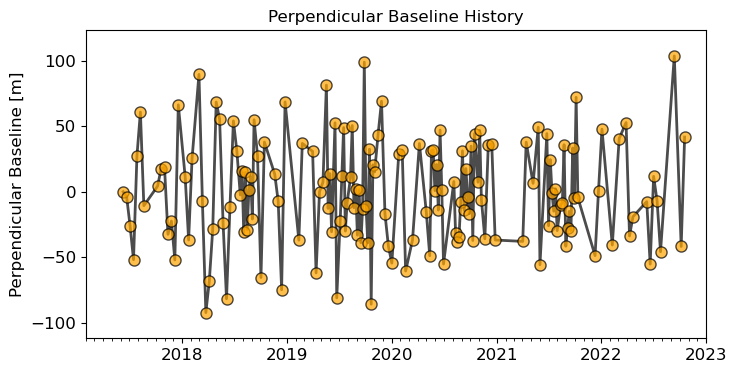

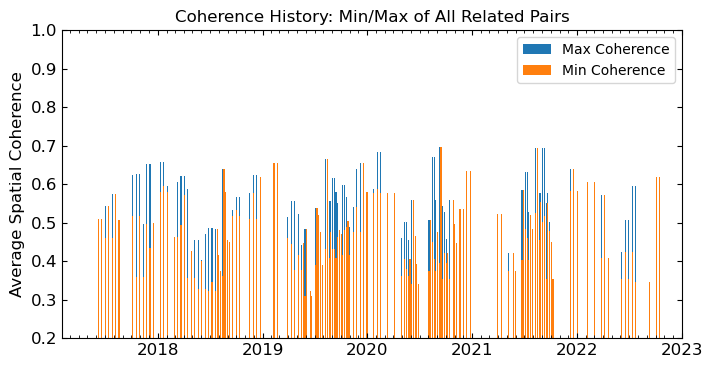

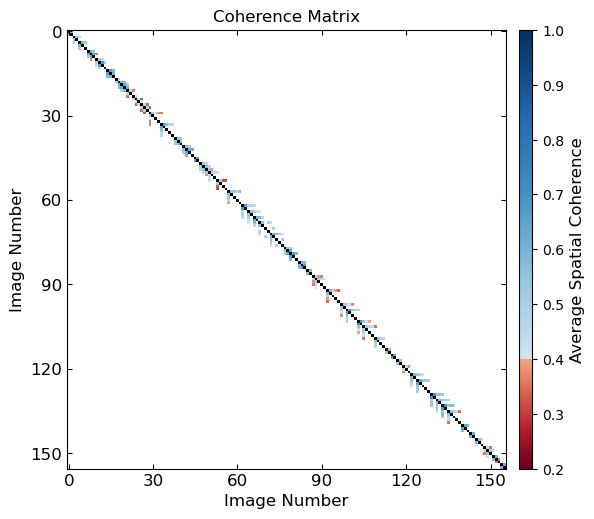

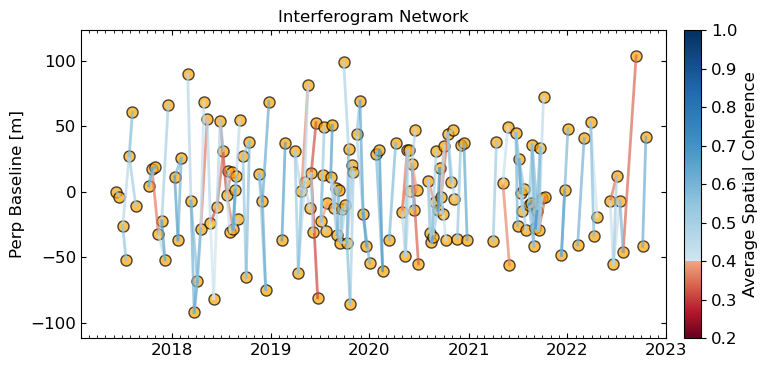

In [14]:
from pathlib import Path
import os
from mintpy.cli import plot_network

plot_dir = mint_path / "plots"
plot_dir.mkdir(exist_ok=True)

# MintPy saves figures in the *current working directory*, so cd to your output dir
cwd = os.getcwd()
os.chdir(plot_dir)
try:
    plot_network.main([str(mint_path / "inputs" / "ifgramStack.h5")])  # default makes several PDFs
finally:
    os.chdir(cwd)

#print("Saved:", [p.name for p in out_dir.glob("*.pdf")])


N interferograms: 163, image size: 2939 x 3713
First 5 pairs: ['20170610-20170622', '20170704-20170716', '20170704-20170728', '20170728-20170809', '20170728-20170821']
Viewing pair: 20180124-20180205 (index 15)


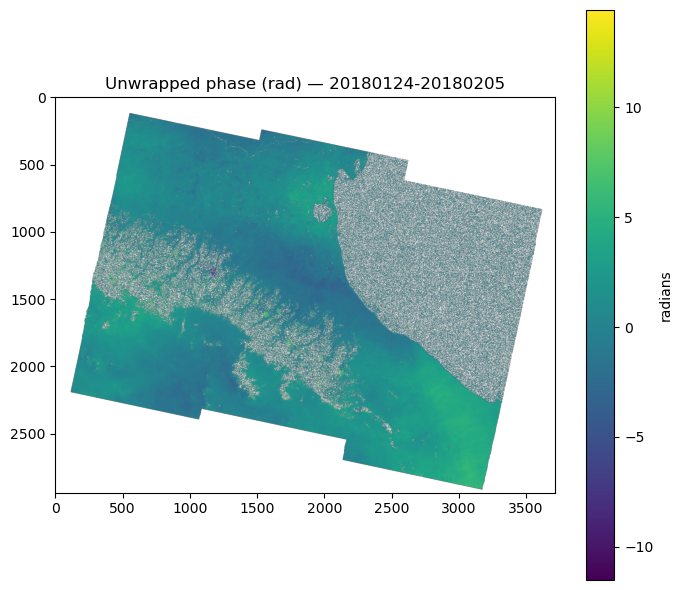

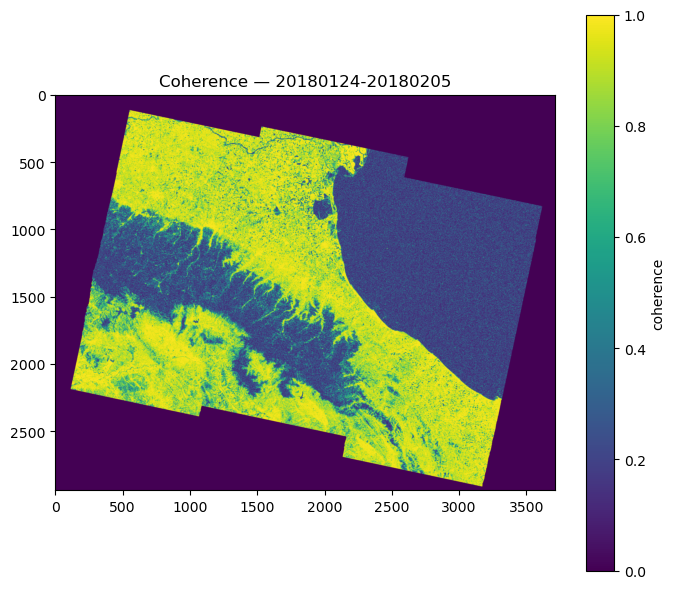

In [15]:
import h5py, numpy as np, matplotlib.pyplot as plt
from pathlib import Path

H5 = Path(mint_path/ "inputs/ifgramStack.h5")

def _decode_dates(d):
    """(N,2) array of byte/str dates -> ['YYYYMMDD-YYYYMMDD', ...]"""
    if isinstance(d[0,0], (bytes, np.bytes_)):
        d = d.astype(str)
    return [f"{d[i,0]}-{d[i,1]}" for i in range(d.shape[0])]

with h5py.File(H5, "r") as f:
    unwrap = f["unwrapPhase"]
    coh    = f["coherence"]
    dates2 = f["date"][...]    # shape (N, 2)
    pairs  = _decode_dates(dates2)
    n_ifg  = unwrap.shape[0]
    print(f"N interferograms: {n_ifg}, image size: {unwrap.shape[1]} x {unwrap.shape[2]}")
    print("First 5 pairs:", pairs[:5])

# ---- pick which interferogram to view ----
idx = 15  # ← change to any index in [0, n_ifg-1]
pair_label = pairs[idx]
print("Viewing pair:", pair_label, f"(index {idx})")

with h5py.File(H5, "r") as f:
    ph  = f["unwrapPhase"][idx, ...]
    co  = f["coherence"][idx, ...].astype(float)

# Optional: mask low coherence for display (does not modify data)
mask = co < 0.2
ph_disp = np.where(mask, np.nan, ph)

# ---- plot (two separate figures) ----
plt.figure(figsize=(7,6))
plt.title(f"Unwrapped phase (rad) — {pair_label}")
plt.imshow(ph_disp, origin="upper")
plt.colorbar(label="radians")
plt.tight_layout()
plt.show()

plt.figure(figsize=(7,6))
plt.title(f"Coherence — {pair_label}")
plt.imshow(co, origin="upper", vmin=0, vmax=1)
plt.colorbar(label="coherence")
plt.tight_layout()
plt.show()


In [26]:
!smallbaselineApp.py /mnt/data/aoi_3_02_bologna/MintPy/mintpy_config.txt --work-dir /mnt/data/aoi_3_02_bologna/MintPy --dostep modify_network

MintPy version 1.6.1, date 2024-07-31
--RUN-at-2025-08-19 18:00:54.857525--
Current directory: /home/ubuntu/work
Run routine processing with smallbaselineApp.py on steps: ['modify_network']
Remaining steps: ['reference_point', 'quick_overview', 'correct_unwrap_error', 'invert_network', 'correct_LOD', 'correct_SET', 'correct_ionosphere', 'correct_troposphere', 'deramp', 'correct_topography', 'residual_RMS', 'reference_date', 'velocity', 'geocode', 'google_earth', 'hdfeos5']
--------------------------------------------------
Project name: mintpy_config
Go to work directory: /mnt/data/aoi_3_02_bologna/MintPy
read custom template file: /mnt/data/aoi_3_02_bologna/MintPy/mintpy_config.txt
update default template based on input custom template
No new option value found, skip updating /mnt/data/aoi_3_02_bologna/MintPy/smallbaselineApp.cfg
read default template file: /mnt/data/aoi_3_02_bologna/MintPy/smallbaselineApp.cfg


******************** step - modify_network ********************
Input da

read temporal/spatial baseline info from file: /mnt/data/aoi_3_02_bologna/MintPy/inputs/ifgramStack.h5
open ifgramStack file: ifgramStack.h5
coherenceSpatialAvg.txt already exists, read it directly
number of acquisitions: 156
number of interferograms: 163
shift all perp baseline by -0.023877998813986778 to zero mean for plotting
--------------------------------------------------
number of interferograms marked as drop: 0
number of interferograms marked as keep: 163
number of acquisitions marked as drop: 0
max perpendicular baseline: 149.39 m
max temporal      baseline: 48.0 days
showing coherence
data range: [0.3099, 0.6959]
display range: (0.2, 1.0)
showing ...


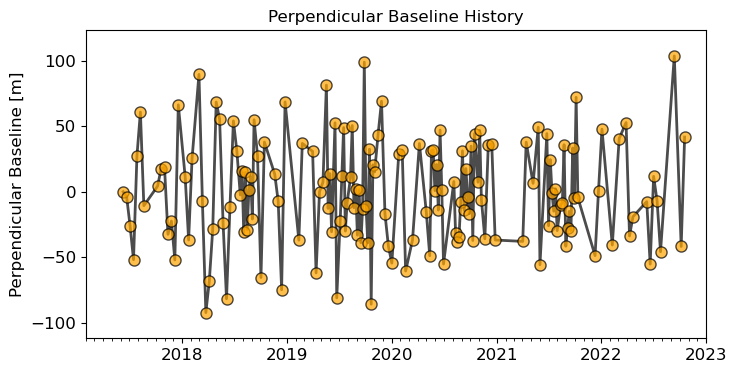

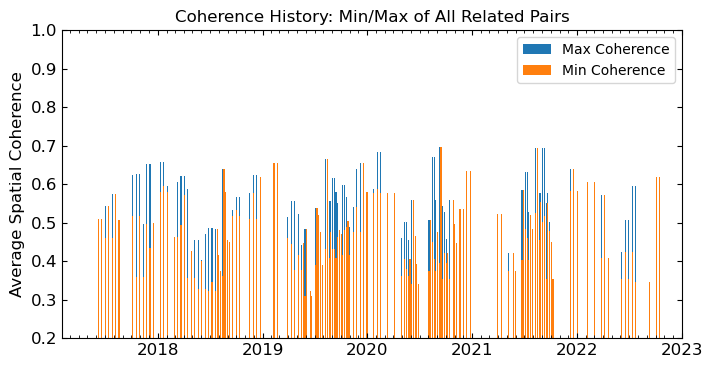

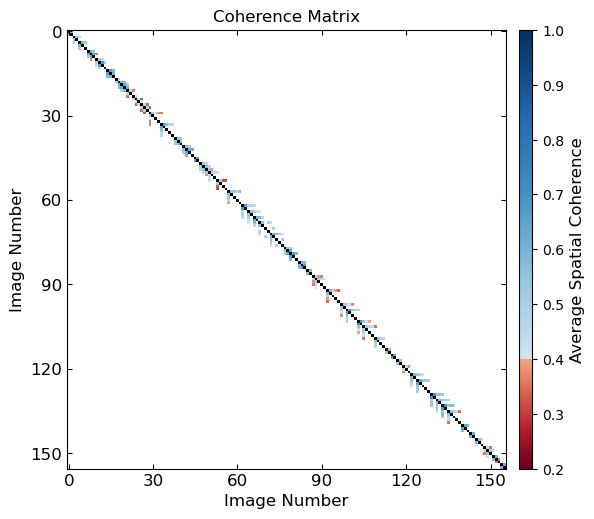

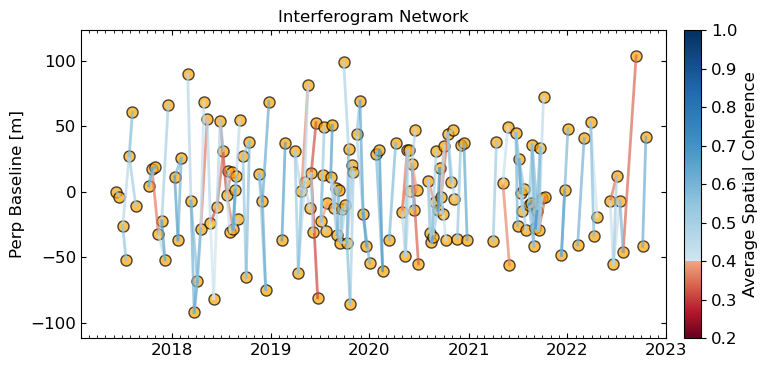

Created in /mnt/data/aoi_3_02_bologna/MintPy/plots :
  coherenceSpatialAvg.txt


In [16]:
from pathlib import Path
import os
from mintpy.cli import plot_network

# --- your MintPy work dir (note the capital P) ---
ifgram_path = mint_path / "inputs" / "ifgramStack.h5"

# output folder for the same set of plots/files

# plot_network writes into the *current working directory*
cwd = os.getcwd()
os.chdir(plot_dir)
try:
    # create the standard outputs:
    #   pbaseHistory.pdf, coherenceHistory.pdf, coherenceMatrix.pdf, network.pdf,
    #   ifgramStack_coherence_spatialAvg.txt
    plot_network.main([str(ifgram_path)])
finally:
    os.chdir(cwd)

# list what we made
made = sorted(p.name for p in plot_dir.glob("*"))
print("Created in", plot_dir, ":\n  " + "\n  ".join(made))


In [33]:
!smallbaselineApp.py /mnt/data/aoi_3_02_bologna/MintPy/mintpy_config.txt --work-dir {mint_path} --dostep reference_point


MintPy version 1.6.1, date 2024-07-31
--RUN-at-2025-08-19 19:35:49.976582--
Current directory: /home/ubuntu/work
Run routine processing with smallbaselineApp.py on steps: ['reference_point']
Remaining steps: ['quick_overview', 'correct_unwrap_error', 'invert_network', 'correct_LOD', 'correct_SET', 'correct_ionosphere', 'correct_troposphere', 'deramp', 'correct_topography', 'residual_RMS', 'reference_date', 'velocity', 'geocode', 'google_earth', 'hdfeos5']
--------------------------------------------------
Project name: mintpy_config
Go to work directory: /mnt/data/aoi_3_02_bologna/MintPy
read custom template file: /mnt/data/aoi_3_02_bologna/MintPy/mintpy_config.txt
update default template based on input custom template
    mintpy.reference.maskFile: auto --> no
copy mintpy_config.txt    to inputs   directory for backup.
copy smallbaselineApp.cfg to inputs   directory for backup.
copy mintpy_config.txt    to pic      directory for backup.
copy smallbaselineApp.cfg to pic      directory 

In [17]:
spatial_coh_pth = mint_path / 'avgSpatialCoh.h5'
conn_comp_mask_path = mint_path / 'maskConnComp.h5'

if not spatial_coh_pth.exists():
    raise Exception(f'Possible error running smallbaselineApp reference_point step. Expected output not found: {spatial_coh_pth}')
if not conn_comp_mask_path.exists():
    raise Warning(f'Possible error running smallbaselineApp reference_point step. Ignore if you are using HyP3 INSAR_GAMMA data, which does not include connected components. Expected output not found: {conn_comp_mask_path}')

In [17]:
!info.py $ifgram_path | egrep 'REF_'


  REF_LAT                             4935120.0
  REF_LON                             233520.0
  REF_X                               1464
  REF_Y                               954


In [1]:
# Invert → time series → velocity
!smallbaselineApp.py /mnt/data/aoi_3_02_bologna/MintPy/mintpy_config.txt \
  --work-dir /mnt/data/aoi_3_02_bologna/MintPy \
  --start invert_network --end velocity



___________________________________________________________

  /##      /## /##             /##     /#######
 | ###    /###|__/            | ##    | ##__  ##
 | ####  /#### /## /#######  /######  | ##  \ ## /##   /##
 | ## ##/## ##| ##| ##__  ##|_  ##_/  | #######/| ##  | ##
 | ##  ###| ##| ##| ##  \ ##  | ##    | ##____/ | ##  | ##
 | ##\  # | ##| ##| ##  | ##  | ## /##| ##      | ##  | ##
 | ## \/  | ##| ##| ##  | ##  |  ####/| ##      |  #######
 |__/     |__/|__/|__/  |__/   \___/  |__/       \____  ##
                                                 /##  | ##
                                                |  ######/
   Miami InSAR Time-series software in Python    \______/
          MintPy 1.6.1, 2024-07-31
___________________________________________________________

--RUN-at-2025-08-22 01:15:00.171711--
Current directory: /home/ubuntu/work
Run routine processing with smallbaselineApp.py on steps: ['invert_network', 'correct_LOD', 'correct_SET', 'correct_ionosphere', 'correct_tr

In [18]:
!ls -ahl {mint_path}


total 41G
drwxrwxr-x    6 ubuntu ubuntu 4.0K Aug 22 01:47 .
drwxrwxr-x 1888 ubuntu ubuntu 280K Aug 19 03:35 ..
drwxrwxr-x    2 ubuntu ubuntu  12K Aug 22 00:21 ERA5
-rw-rw-r--    1 ubuntu ubuntu  43M Aug 19 19:36 avgSpatialCoh.h5
-rw-rw-r--    1 ubuntu ubuntu 7.6K Aug 19 08:11 coherenceSpatialAvg.txt
-rw-rw-r--    1 ubuntu ubuntu  43M Aug 22 01:29 demErr.h5
drwxrwxr-x    2 ubuntu ubuntu 4.0K Aug 22 00:23 inputs
-rw-rw-r--    1 ubuntu ubuntu  11M Aug 19 18:37 maskConnComp.h5
-rw-rw-r--    1 ubuntu ubuntu  11M Aug 19 19:48 maskTempCoh.h5
-rw-rw-r--    1 ubuntu ubuntu 1.9K Aug 21 22:46 mintpy_config.txt
-rw-rw-r--    1 ubuntu ubuntu  43M Aug 19 19:48 numInvIfgram.h5
drwxrwxr-x    2 ubuntu ubuntu 4.0K Aug 22 01:47 pic
drwxrwxr-x    2 ubuntu ubuntu 4.0K Aug 19 07:03 plots
-rw-rw-r--    1 ubuntu ubuntu    9 Aug 22 01:33 reference_date.txt
-rw-rw-r--    1 ubuntu ubuntu 4.7K Aug 22 01:33 rms_timeseriesResidual_ramp.txt
-rw-rw-r--    1 ubuntu ubuntu  25K Aug 21 22:49 smallbaselineApp.cfg
-rw-rw-

timeseries.h5 — SBAS displacement time series (meters, LOS), uncorrected.

timeseriesResidual.h5 — residual after model removal (e.g., ramp/DEM error if enabled).

timeseries_ERA5.h5 — time series after tropospheric (ERA5) correction.

timeseries_ERA5_ramp.h5 — ERA5-corrected and linear ramp removed.

timeseries_ERA5_ramp_demErr.h5 — ERA5-corrected, ramp removed, DEM error corrected (usually your “final”).

velocity.h5 / velocityERA5.h5 — average rate (m/yr) from the corresponding time series.

temporalCoherence.h5 — temporal coherence (0–1), one map.

avgSpatialCoh.h5 — spatial coherence averaged through time.

numInvIfgram.h5 — number of interferograms used per pixel.

demErr.h5 — estimated DEM error map (meters) if that step ran.

waterMask.h5 — mask (1 water / 0 land or similar depending on build).

maskTempCoh.h5, maskConnComp.h5 — masks used (by coherence, connected components).

ERA5/ — aux files for the atmosphere correction.

smallbaselineApp.cfg / mintpy_config.txt — the config you ran.

reference_date.txt — the reference epoch.

plots/ pic/ — generated figures.

In [24]:
!ls -ahl {mint_path}/inputs

total 17G
drwxrwxr-x 2 ubuntu ubuntu 4.0K Aug 22 00:23 .
drwxrwxr-x 6 ubuntu ubuntu 4.0K Aug 26 18:34 ..
-rw-rw-r-- 1 ubuntu ubuntu 2.7G Aug 22 00:29 ERA5.h5
-rw-rw-r-- 1 ubuntu ubuntu 163M Aug 19 01:08 geometryGeo.h5
-rw-rw-r-- 1 ubuntu ubuntu  14G Aug 19 19:36 ifgramStack.h5
-rw-rw-r-- 1 ubuntu ubuntu 1.9K Aug 21 22:46 mintpy_config.txt
-rw-rw-r-- 1 ubuntu ubuntu  25K Aug 21 22:49 smallbaselineApp.cfg


In [26]:
from pathlib import Path

mint_path = Path(mint_path)  
candidates = [
    "timeseries_ERA5_ramp_demErr.h5",
    "timeseries_ERA5_ramp.h5",
    "timeseries_ERA5.h5",
    "timeseriesResidual_ramp.h5",
    "timeseriesResidual.h5",
    "timeseries.h5",
]


In [27]:
from pathlib import Path
import h5py, numpy as np

mint_path = Path(mint_path)  # you already set this
candidates = [
    "timeseries_ERA5_ramp_demErr.h5",
    "timeseries_ERA5_ramp.h5",
    "timeseries_ERA5.h5",
    "timeseriesResidual_ramp.h5",
    "timeseriesResidual.h5",
    "timeseries.h5",
]

def dump_h5(path, print_data=False, max_values=40):
    """Print structure + attributes (optionally small data samples)."""
    print(f"\n=== FILE: {path} ===")
    with h5py.File(path, "r") as f:
        # show top-level keys
        print("Top-level keys:", list(f.keys()))
        # dates (if present as a dataset)
        if "date" in f:
            raw = f["date"][:]
            dates = [d.decode() if isinstance(d, (bytes, np.bytes_)) else str(d) for d in raw]
            if print_data or len(dates) <= max_values:
                print("date:", dates)
            else:
                print(f"date ({len(dates)}):", dates[:10], "...", dates[-3:])

        def _visit(name, obj):
            if isinstance(obj, h5py.Dataset):
                print(f"[DATASET] /{name}  shape={obj.shape}  dtype={obj.dtype}")
            else:
                print(f"[GROUP]   /{name}")
            if obj.attrs:
                # print ALL attributes
                attrs = {k: obj.attrs[k] for k in obj.attrs.keys()}
                # decode bytes attrs for readability
                for k, v in list(attrs.items()):
                    if isinstance(v, (bytes, np.bytes_)):
                        attrs[k] = v.decode(errors="ignore")
                print("  attrs:", attrs)
            if isinstance(obj, h5py.Dataset) and print_data:
                arr = obj[...]
                flat = np.asarray(arr).ravel()
                print("  data sample:", flat[:max_values])

        f.visititems(_visit)



In [ ]:
# run the dump for each candidate that exists (NO CSV/plots here)
for fname in candidates:
    p = mint_path / fname
    if p.exists():
        dump_h5(p, print_data=False)   # set True if you want value samples too
    else:
        print(f"Missing: {p}")


In [29]:
p = mint_path / candidates[0]
if p.exists():
    dump_h5(p, print_data=False)   # set True if you want value samples too
else:
    print(f"Missing: {p}")



=== FILE: /mnt/data/aoi_3_02_bologna/MintPy/timeseries_ERA5_ramp_demErr.h5 ===
Top-level keys: ['bperp', 'date', 'timeseries']
date (156): ['20170610', '20170622', '20170704', '20170716', '20170728', '20170809', '20170821', '20171008', '20171020', '20171101'] ... ['20220912', '20221006', '20221018']
[DATASET] /bperp  shape=(156,)  dtype=float32
[DATASET] /date  shape=(156,)  dtype=|S8
[DATASET] /timeseries  shape=(156, 2939, 3713)  dtype=float32


In [20]:
vel_candidates = ["velocityERA5.h5", "velocity.h5"]
vel_path = next((mint_path/f for f in vel_candidates if (mint_path/f).exists()), None)
print("Velocity file:", vel_path)


Velocity file: /mnt/data/aoi_3_02_bologna/MintPy/velocityERA5.h5


In [25]:

mint_path = Path(mint_path) 

geo_candidates = [
    mint_path / "inputs" / "geometryGeo.h5",
    mint_path / "inputs" / "geometryRadar.h5",
    mint_path / "geometryGeo.h5",         # fallbacks
    mint_path / "geometryRadar.h5",
]

geo_path = next((p for p in geo_candidates if p.exists()), None)
print("Geometry file:", geo_path)
assert geo_path is not None, "No geometryGeo.h5/geometryRadar.h5 found."


Geometry file: /mnt/data/aoi_3_02_bologna/MintPy/inputs/geometryGeo.h5


In [32]:
from pathlib import Path
import h5py, numpy as np
import matplotlib.pyplot as plt
import pandas as pd

mint_path = Path(mint_path)
ts_path  = mint_path / "timeseries_ERA5_ramp_demErr.h5"   # choose any ts file you want
geo_path = mint_path / "inputs" / "geometryGeo.h5"        # your geometry file

with h5py.File(ts_path, "r") as f:
    ds = f["timeseries"]
    # robust date read (works across MintPy versions)
    if "date" in f:
        dates = [d.decode() if isinstance(d,(bytes, np.bytes_)) else str(d) for d in f["date"][:]]
    else:
        dates = [d.decode() if isinstance(d,(bytes, np.bytes_)) else str(d)
                 for d in ds.attrs.get("date", ds.attrs.get("DATE_LIST", []))]
    T, ny, nx = ds.shape
print(f"{ts_path.name}: T={T}, ny={ny}, nx={nx}")


timeseries_ERA5_ramp_demErr.h5: T=156, ny=2939, nx=3713


In [33]:
!info.py {ts_path}

******************** Basic File Info ************************
file name: /mnt/data/aoi_3_02_bologna/MintPy/timeseries_ERA5_ramp_demErr.h5
file type: timeseries
coordinates : GEO

******************** Date Stat Info *************************
Start Date: 20170610
End   Date: 20221018
Number of dates  : 156
STD of datetimes : 1.42 years

******************** HDF5 File Structure ********************
Attributes in / level:
  ALOOKS                                      4
  ANTENNA_SIDE                                -1
  AZIMUTH_PIXEL_SIZE                          56.4
  BANDS                                       1
  CENTER_LINE_UTC                             19151.797495
  DATA_TYPE                                   float32
  DATE12                                      170610-170622
  EARTH_RADIUS                                6367896.9087
  END_DATE                                    20221018
  EPSG                                        32633
  FILE_LENGTH                              

In [34]:
input_dir = mint_path / "inputs"
!info.py {input_dir}/ifgramStack.h5

******************** Basic File Info ************************
file name: /mnt/data/aoi_3_02_bologna/MintPy/inputs/ifgramStack.h5
file type: ifgramStack
coordinates : GEO

******************** HDF5 File Structure ********************
Attributes in / level:
  ALOOKS                              4
  ANTENNA_SIDE                        -1
  AZIMUTH_PIXEL_SIZE                  56.4
  BANDS                               1
  CENTER_LINE_UTC                     19151.797495
  DATA_TYPE                           float32
  DATE12                              170610-170622
  EARTH_RADIUS                        6367896.9087
  EPSG                                32633
  FILE_LENGTH                         2945
  FILE_PATH                           /mnt/data/aoi_3_02_bologna/S1AA_20170610T051909_20170622T051910_VVP012_INT80_G_weF_EFD8_1/S1AA_20170610T051909_20170622T051910_VVP012_INT80_G_weF_EFD8_unw_phase.tif
  FILE_TYPE                           ifgramStack
  HEADING                             -1

In [38]:
ifg_path = Path(mint_path) / "inputs" / "ifgramStack.h5"
with h5py.File(ifg_path, "r") as f:
    # list of date pairs like 'YYYYMMDD_YYYYMMDD'
    if "date" in f:
        ifg_pairs = [d.decode() if isinstance(d,(bytes,np.bytes_)) else str(d) for d in f["date"][:]]
    else:
        ifg_pairs = [d.decode() for d in f["unwrapPhase"].attrs.get("DATE12_LIST", [])]
print(f"{ifg_path.name} -> {len(ifg_pairs)} interferograms")
print(ifg_pairs[:5], "...", ifg_pairs[-5:])


ifgramStack.h5 -> 163 interferograms
["[b'20170610' b'20170622']", "[b'20170704' b'20170716']", "[b'20170704' b'20170728']", "[b'20170728' b'20170809']", "[b'20170728' b'20170821']"] ... ["[b'20220620' b'20220702']", "[b'20220620' b'20220714']", "[b'20220714' b'20220726']", "[b'20220726' b'20220912']", "[b'20221006' b'20221018']"]


In [42]:
pair = ifg_pairs[0]  # e.g. '20170610_20170622' that you listed above
!python -m mintpy.view "{mint_path}/inputs/ifgramStack.h5" {pair} --ncols 3 -u cm


In [35]:
!info.py {input_dir}/geometryGeo.h5 --compact

******************** Basic File Info ************************
file name: /mnt/data/aoi_3_02_bologna/MintPy/inputs/geometryGeo.h5
file type: geometry
coordinates : GEO

******************** HDF5 File Structure ********************
Attributes in / level:
  ALOOKS                4
  ANTENNA_SIDE          -1
  AZIMUTH_PIXEL_SIZE    56.4
  BANDS                 1
  CENTER_LINE_UTC       19136.955199
  DATA_TYPE             float32
  EARTH_RADIUS          6367650.2279
  EPSG                  32633
  FILE_LENGTH           2939
  FILE_PATH             /mnt/data/aoi_3_02_bologna/S1AA_20170129T051855_20170210T051854_VVP012_INT80_G_weF_8A34_1/S1AA_20170129T051855_20170210T051854_VVP012_INT80_G_weF_8A34_dem.tif
  FILE_TYPE             geometry
  HEADING               -165.8857749
  HEIGHT                702057.2758999998
  INTERLEAVE            BSQ
  LAT_REF1              5084280.0
  LAT_REF2              5084280.0
  LAT_REF3              4849160.0
  LAT_REF4              4849160.0
  LENGTH       

In [37]:
%matplotlib inline
import os
import numpy as np
import matplotlib.pyplot as plt
from mintpy.objects import ifgramStack
from mintpy.utils import plot as pp, utils as ut
from mintpy import view, plot_network
#from mintpy.unwrap_error_phase_closure import plot_num_triplet_with_nonzero_integer_ambiguity


In [44]:
import h5py, numpy as np
ts_path = p
with h5py.File(ts_path, "r") as f:
    print("Top-level keys:", list(f.keys()))         # often ['timeseries','date']
    ds = f["timeseries"]
    print("dataset:", ds.name, "shape (T,ny,nx) =", ds.shape, "dtype:", ds.dtype)

    # robust date extraction across MintPy versions
    if "date" in f:
        ts_dates = [d.decode() if isinstance(d,(bytes,np.bytes_)) else str(d) for d in f["date"][:]]
    else:
        ts_dates = [d.decode() if isinstance(d,(bytes,np.bytes_)) else str(d)
                 for d in ds.attrs.get("date", ds.attrs.get("DATE_LIST", []))]
    print("First/last dates:", ts_dates[:3], "...", ts_dates[-3:])

    # useful attributes if present
    for k in ["LENGTH","WIDTH","X_FIRST","Y_FIRST","X_STEP","Y_STEP","refY","refX","UNIT","REF_DATE"]:
        if k in ds.attrs:
            print(f"{k}: {ds.attrs[k]}")


Top-level keys: ['bperp', 'date', 'timeseries']
dataset: /timeseries shape (T,ny,nx) = (156, 2939, 3713) dtype: float32
First/last dates: ['20170610', '20170622', '20170704'] ... ['20220912', '20221006', '20221018']


In [45]:
date = ts_dates[-1]  # e.g. '20170809' – choose any from ts_dates
!python -m mintpy.view "{ts_path}" timeseries.{date} -u cm
# (alternative: by index)  !python -m mintpy.view "{ts_path}" -n 1 -u cm


run view.py in MintPy version 1.6.1, date 2024-07-31
input file is ifgramStack file: /mnt/data/aoi_3_02_bologna/MintPy/inputs/ifgramStack.h5 in float32 format
file size in y/x: (2939, 3713)
input dataset: "["[b'20170610' b'20170622']"]"
num of datasets in file ifgramStack.h5: 326
num of datasets to exclude: 0
num of datasets to display: 326
data   coverage in y/x: (0, 0, 3713, 2939)
subset coverage in y/x: (0, 0, 3713, 2939)
data   coverage in lat/lon: (116360.0, 5011480.0, 413400.0, 4776360.0)
subset coverage in lat/lon: (116360.0, 5011480.0, 413400.0, 4776360.0)
------------------------------------------------------------------------
colormap: jet
figure title: unwrapPhase
figure size : [15.00, 8.00]
dataset number: 326
row     number: 1
column  number: 3
figure  number: 109
row number is 1, adjust figure size to [10.0, 2.1]
consider reference pixel in y/x: [954, 1464]
mark interferograms with 'dropIfgram=False' in red colored title
----------------------------------------
Figure 1 -

/home/ubuntu/anaconda3/envs/insar/lib/python3.13/site-packages/mintpy/view.py:1366: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(


[==================================================] unwrapPhase-20190706_20190724   10s /     5s 
plotting ...
[==================================================] unwrapPhase-20190706_20190724    0s /     0s 
data    range: [np.float32(-25.824408), np.float32(35.180054)] None
Note: different color scale for EACH subplot!
Adjust figsize for the colorbar of each subplot.
----------------------------------------
Figure 22 - unwrapPhase_22.png
reading data as a list of 2D matrices ...
[==================================================] unwrapPhase-20190811_20190823    0s /     0s 
plotting ...
[==================================================] unwrapPhase-20190811_20190823    0s /     0s 
data    range: [np.float32(-32.607418), np.float32(26.70744)] None
Note: different color scale for EACH subplot!
Adjust figsize for the colorbar of each subplot.
----------------------------------------
Figure 23 - unwrapPhase_23.png
reading data as a list of 2D matrices ...
[========================

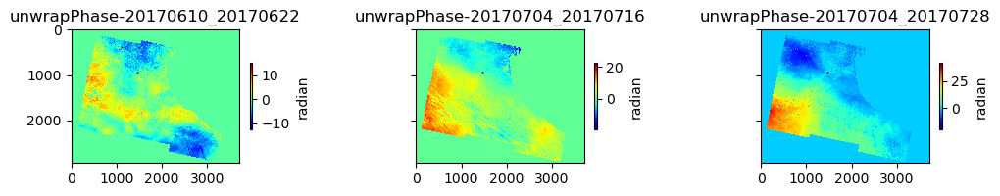

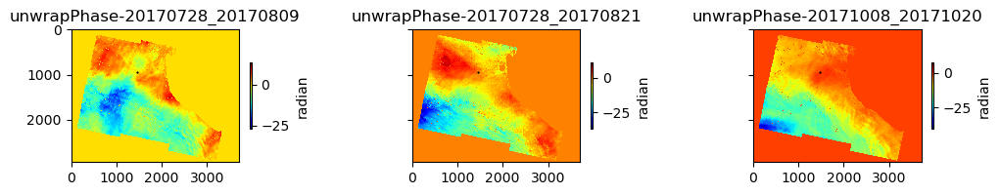

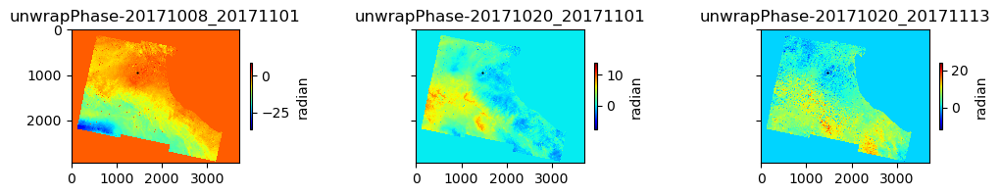

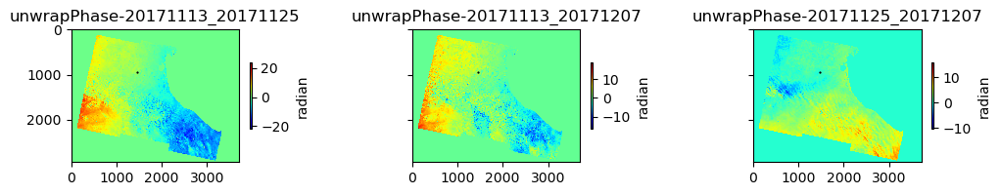

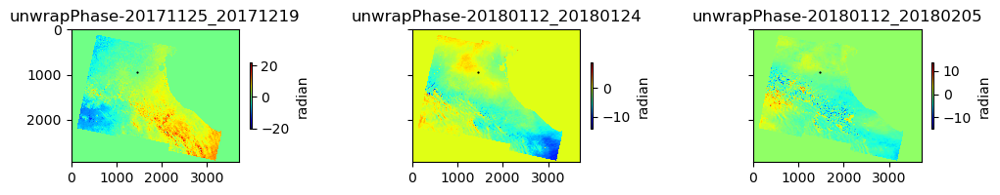

...

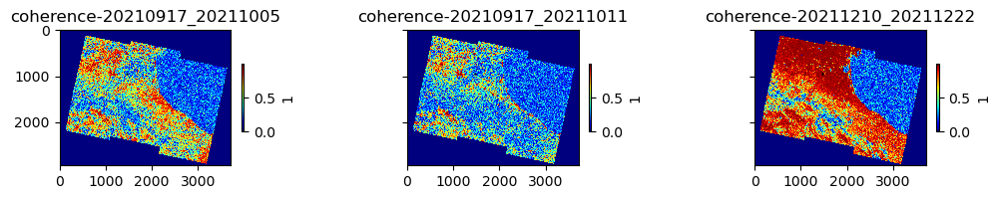

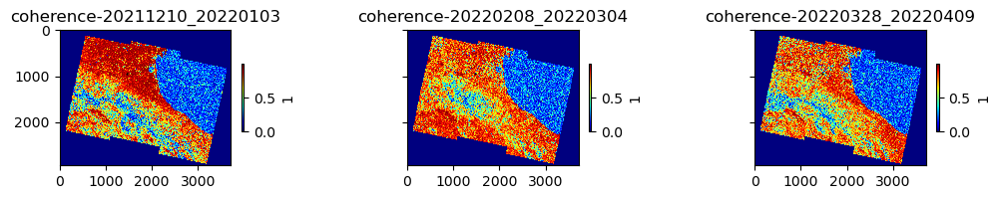

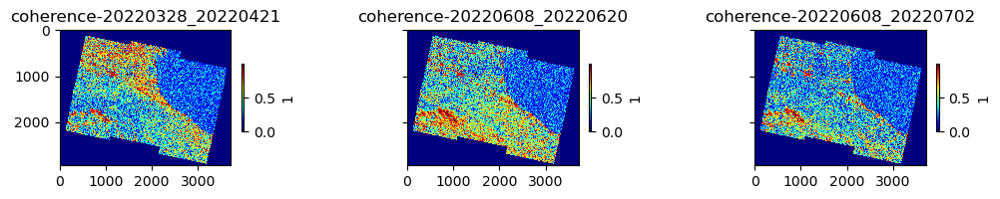

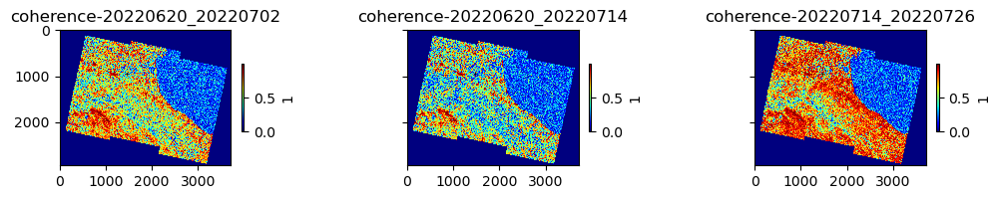

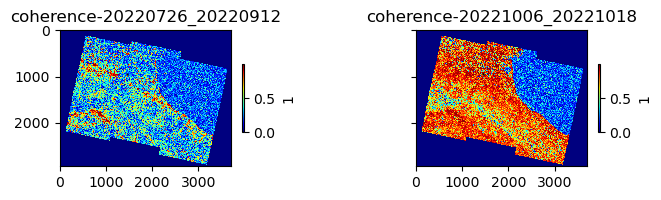

run view.py in MintPy version 1.6.1, date 2024-07-31
input file is timeseries file: /mnt/data/aoi_3_02_bologna/MintPy/timeseries_ERA5_ramp_demErr.h5 in float32 format
file size in y/x: (2939, 3713)
input dataset: "['timeseries.20221018']"
num of datasets in file timeseries_ERA5_ramp_demErr.h5: 156
datasets to exclude (0):
[]
datasets to display (1):
['timeseries-20221018']
data   coverage in y/x: (0, 0, 3713, 2939)
subset coverage in y/x: (0, 0, 3713, 2939)
data   coverage in lat/lon: (116360.0, 5011480.0, 413400.0, 4776360.0)
subset coverage in lat/lon: (116360.0, 5011480.0, 413400.0, 4776360.0)
------------------------------------------------------------------------
colormap: jet
figure title: timeseries-20221018_ERA5_ramp_demErr
figure size : [9.5, 6.0]
read mask from file: maskTempCoh.h5
reading data ...
masking data
masking pixels with NO_DATA_VALUE of 0.0
data    range: [np.float32(-17.53077), np.float32(22.856726)] cm
display range: [np.float32(-17.53077), np.float32(22.856726)]

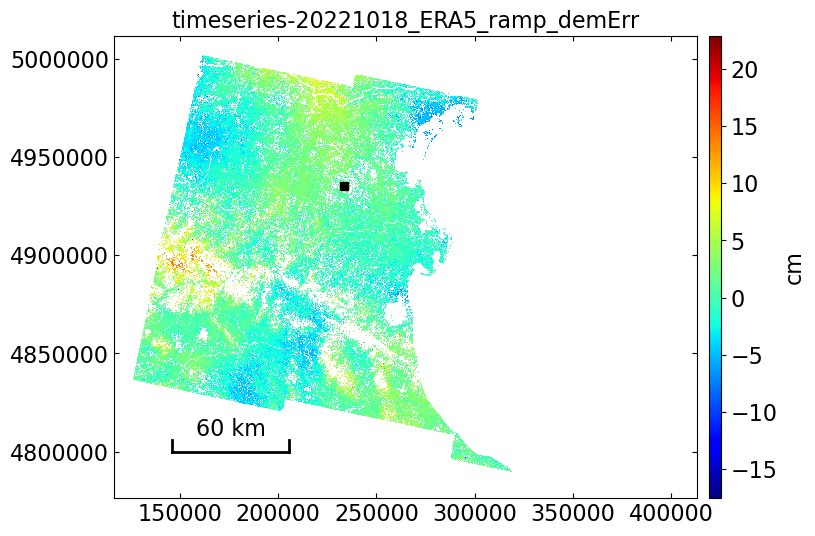

In [46]:
from mintpy.cli.view import main as view_main  # works across MintPy versions

# 1) one interferogram
pair = ifg_pairs[0]  # e.g. '20170610_20170622'
view_main([str(ifg_path), pair, "--ncols", "3", "-u", "cm"])

# 2) one epoch from your time series
date = ts_dates[-1]  # pick any from ts_dates
view_main([str(ts_path), f"timeseries.{date}", "-u", "cm"])


tsview.py /mnt/data/aoi_3_02_bologna/MintPy/timeseries_ERA5_ramp_demErr.h5 -l /mnt/data/aoi_3_02_bologna/MintPy/inputs/geometryGeo.h5 -m /mnt/data/aoi_3_02_bologna/MintPy/waterMask.h5 -u cm
open timeseries file: timeseries_ERA5_ramp_demErr.h5
data   coverage in y/x: (0, 0, 3713, 2939)
subset coverage in y/x: (0, 0, 3713, 2939)
data   coverage in lat/lon: (116360.0, 5011480.0, 413400.0, 4776360.0)
subset coverage in lat/lon: (116360.0, 5011480.0, 413400.0, 4776360.0)
------------------------------------------------------------------------
total number of pixels: 1.7E+09
* multilook 8 by 8 with nearest interpolation for display to save memory
reference point in y/x: (954, 1464)
reference point in lat/lon: (4935120.0, 233520.0)
estimate deformation model with the following assumed time functions:
    polynomial : 1
    periodic   : []
    stepDate   : []
    polyline   : []
    exp        : {}
    log        : {}
reading timeseries from file /mnt/data/aoi_3_02_bologna/MintPy/timeseries_ER

reading 2D slices 156/156...
reference to date: 20220103
read mask from file: waterMask.h5
data    range: [np.float32(-68.172226), np.float32(40.85776)] cm
display range: [np.float32(-28.125896), np.float32(19.891485)] cm
create figure for map in size of [6.0, 7.0]
display data in transparency: 1.0
plot in geo-coordinate
plotting data as image via matplotlib.pyplot.imshow ...
plot scale bar: [0.2, 0.2, 0.1]
plot reference point
create figure for point in size of [8.0, 4.5]
showing ...

------------------------------------------------------------------------
To scroll through the image sequence:
1) Move the slider, OR
2) Press left or right arrow key (if not responding, click the image and try again).
------------------------------------------------------------------------


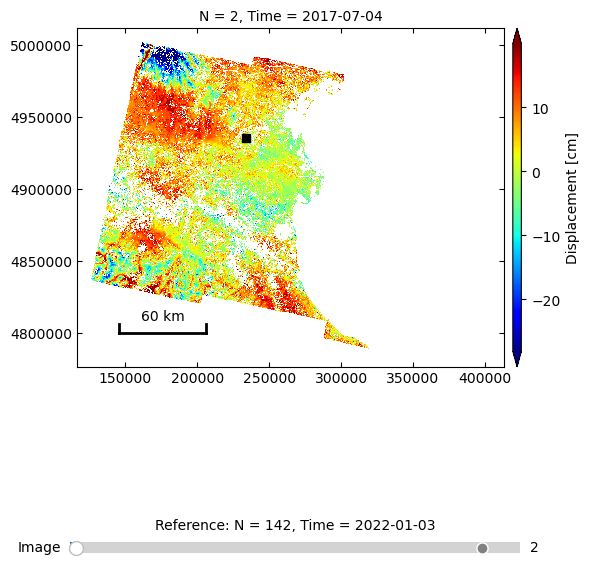

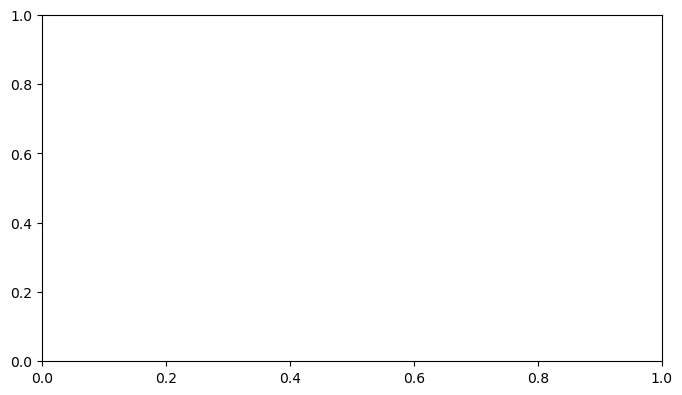

In [49]:
from mintpy.cli.tsview import main as tsview_main

geo = mint_path / "inputs" / "geometryGeo.h5"
mask = mint_path / "waterMask.h5"       # optional; drop if you want

tsview_main([str(ts_path), "-l", str(geo), "-m", str(mask), "-u", "cm"])


In [23]:
import pandas as pd

iy, ix = 100, 150    # <- pick your pixel indices
with h5py.File(ts_path,"r") as f:
    ts_m = f["timeseries"][:, iy, ix]

df = pd.DataFrame({"date": pd.to_datetime(dates), "disp_m": ts_m})
out_csv = mint_path / f"ts_y{iy}_x{ix}.csv"
df.to_csv(out_csv, index=False)
out_csv


PosixPath('/mnt/data/aoi_3_02_bologna/MintPy/ts_y100_x150.csv')

In [ ]:
from pathlib import Path
from typing import List, Union
from osgeo import gdal

def get_common_overlap(file_list: List[Union[str, Path]]) -> List[float]:
    """Get the common overlap of GeoTIFF files with correct projWin bounds."""
    corners = [gdal.Info(str(file), format='json')['cornerCoordinates'] for file in file_list]

    ulx = min(corner['upperLeft'][0] for corner in corners)
    uly = max(corner['upperLeft'][1] for corner in corners)
    lrx = max(corner['lowerRight'][0] for corner in corners)
    lry = min(corner['lowerRight'][1] for corner in corners)

    

    return [ulx, uly, lrx, lry]




## 3. Time-series Analysis with MintPy

### 3.1 Subset all GeoTIFFs to their common overlap

In [55]:
import sys
sys.path.append('/home/ubuntu/tools/MintPy/src')

from mintpy.cli import prep_hyp3
from mintpy.utils import readfile, writefile
from pathlib import Path
import os


In [65]:
print (f"Data directory: {data_dir}")

Data directory: /mnt/data/aoi_3_bologna


In [69]:
from mintpy.utils import writefile
print(dir(writefile))  # check if 'write_roipac_rsc' is listed


['__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__spec__', 'h5py', 'layout_hdf5', 'np', 'os', 'readfile', 'remove_hdf5_dataset', 'shutil', 'write', 'write_binary', 'write_bool', 'write_byte', 'write_complex_float32', 'write_complex_int16', 'write_float32', 'write_gdal_vrt', 'write_hdf5_block', 'write_isce_file', 'write_isce_xml', 'write_real_float32', 'write_real_float64', 'write_real_int16', 'write_roipac_rsc']


In [ ]:
from mintpy import prep_hyp3
from mintpy.utils import readfile, writefile
from pathlib import Path


# Define file patterns to include
patterns = [
    "*unw_phase*.tif",
    "*corr*.tif",
    "*dem*.tif",
    "*lv_theta*.tif"
]

# Collect all matching files
all_tifs = []
for pat in patterns:
    all_tifs.extend(data_dir.rglob(pat))

# Loop through and write .rsc for each
for tif_file in sorted(all_tifs):
    try:
        print(f"Processing: {tif_file.name}")
        meta = readfile.read_gdal_vrt(str(tif_file))
        meta = prep_hyp3.add_hyp3_metadata(str(tif_file), meta)
        writefile.write_roipac_rsc(meta, str(tif_file) + ".rsc")
    except Exception as e:
        print(f"❌ Failed on {tif_file.name}: {e}")


In [35]:
from osgeo import gdal
gdal.UseExceptions()
data_dir = Path(data_dir)
files = data_dir.glob('*/*_dem.tif')

overlap = get_common_overlap(files)

In [36]:
print(overlap)

[428520.0, 5126200.0, 747320.0, 4735720.0]


In [41]:
## Check this alternative later ... !
# Clip all GeoTIFF files to their common overlap
from pathlib import Path
from typing import List, Union
from osgeo import gdal
from tqdm import tqdm

def clip_hyp3_products_to_common_overlap(data_dir: Union[str, Path], overlap: List[float]) -> None:
    """Clip all GeoTIFF files to their common overlap

    Args:
        data_dir: directory containing the GeoTIFF files to clip
        overlap: [ulx, uly, lrx, lry] of the common overlap area
    Returns: None
    """

    data_dir = Path(data_dir)
    files_for_mintpy = ['_water_mask.tif', '_corr.tif', '_unw_phase.tif', '_dem.tif', '_lv_theta.tif', '_lv_phi.tif']

    for extension in files_for_mintpy:
        matching_files = list(data_dir.rglob(f'*{extension}'))
        for file in tqdm(matching_files, desc=f'Clipping {extension} files'):
            dst_file = file.parent / f'{file.stem}_clipped{file.suffix}'
            gdal.Translate(destName=str(dst_file), srcDS=str(file), projWin=overlap)


In [37]:
from pathlib import Path
from typing import List, Union

def clip_hyp3_products_to_common_overlap(data_dir: Union[str, Path], overlap: List[float]) -> None:
    """Clip all GeoTIFF files to their common overlap
    
    Args:
        data_dir:
            directory containing the GeoTIFF files to clip
        overlap:
            a list of the upper-left x, upper-left y, lower-right-x, and lower-tight y
            corner coordinates of the common overlap
    Returns: None
    """

    
    files_for_mintpy = ['_water_mask.tif', '_corr.tif', '_unw_phase.tif', '_dem.tif', '_lv_theta.tif', '_lv_phi.tif']

    for extension in files_for_mintpy:

        for file in data_dir.rglob(f'*{extension}'):

            dst_file = file.parent / f'{file.stem}_clipped{file.suffix}'

            gdal.Translate(destName=str(dst_file), srcDS=str(file), projWin=overlap)

In [ ]:
from osgeo import gdal
gdal.UseExceptions()

clip_hyp3_products_to_common_overlap(data_dir, overlap)

### 3.2 Create the MintPy config file

In [50]:
mintpy_config = work_dir / 'mintpy_config.txt'
mintpy_config.write_text(
f"""
##---------processor info:
mintpy.load.processor        = hyp3

##---------interferogram datasets:
mintpy.load.unwFile          = {data_dir}/*/*_unw_phase_clipped.tif
mintpy.load.corFile          = {data_dir}/*/*_corr_clipped.tif

##---------geometry datasets:
mintpy.load.demFile          = {data_dir}/*/*_dem_clipped.tif
mintpy.load.incAngleFile     = {data_dir}/*/*_lv_theta_clipped.tif
mintpy.load.azAngleFile      = {data_dir}/*/*_lv_phi_clipped.tif
mintpy.load.waterMaskFile    = {data_dir}/*/*_water_mask_clipped.tif

##---------tropospheric delay correction:
mintpy.troposphericDelay.method        = weatherModel
mintpy.weatherModel.weatherModel       = ERA5
mintpy.weatherModel.weatherDir         = {data_dir}
mintpy.weatherModel.weatherFile        = era5_tcwv_*.nc
mintpy.weatherModel.heightRef          = auto

##---------additional options:
mintpy.network.inBaseline              = yes
mintpy.network.maxTempBaseline         = 180
mintpy.network.maxBTempBaseline        = 1500

mintpy.unwrapMask.connCompMinPix       = 100
mintpy.unwrapMask.maskFile             = auto

mintpy.waterBody.mask                  = auto
mintpy.reference.pixelMethod           = lonlat
mintpy.reference.lalo                  = 44.5199558120, 11.6468120447  # MEDI GPS lat, lon (adjusted from -348° to +11.65°)
mintpy.reference.interpMethod          = linear
mintpy.tempCohMask.min                 = 0.7
mintpy.deramp                          = quadratic
""")


1536

### 3.3 run MintPy to do the time series analysis

In [73]:
!smallbaselineApp.py --dir {work_dir} {mintpy_config}


___________________________________________________________

  /##      /## /##             /##     /#######
 | ###    /###|__/            | ##    | ##__  ##
 | ####  /#### /## /#######  /######  | ##  \ ## /##   /##
 | ## ##/## ##| ##| ##__  ##|_  ##_/  | #######/| ##  | ##
 | ##  ###| ##| ##| ##  \ ##  | ##    | ##____/ | ##  | ##
 | ##\  # | ##| ##| ##  | ##  | ## /##| ##      | ##  | ##
 | ## \/  | ##| ##| ##  | ##  |  ####/| ##      |  #######
 |__/     |__/|__/|__/  |__/   \___/  |__/       \____  ##
                                                 /##  | ##
                                                |  ######/
   Miami InSAR Time-series software in Python    \______/
          MintPy 1.6.1.post41, 2025-06-11
___________________________________________________________

--RUN-at-2025-07-18 18:59:23.322634--
Current directory: /home/ubuntu/work
Run routine processing with smallbaselineApp.py on steps: ['load_data', 'modify_network', 'reference_point', 'quick_overview', 'corre

In [ ]:
%matplotlib widget
from mintpy.cli import view, tsview

In [ ]:
view.main([f'{work_dir}/velocity.h5'])

In [ ]:
tsview.main([f'{work_dir}/timeseries.h5'])